In [1]:
!pip install ultralytics
!pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.2/645.2 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.9/243.9 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.7 MB/s eta 0:00:00


In [2]:
import os
import wandb
import matplotlib.pyplot as plt
import torch
from PIL import Image
from ultralytics import YOLO

In [3]:
# Подключение гугл диска
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!wandb login --relogin
wandb.login()

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


wandb: Currently logged in as: parshin_d (dentist_ai). Use `wandb login --relogin` to force relogin


True

In [ ]:
# Скачивание датасета с wandb.

path_to_data = "drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_2_Caries_v0-v0"

if os.path.isdir(path_to_data):
    artifact_dir = path_to_data
else:
    artifact = run.use_artifact("dentist_ai/Dentist_AI/dentasis_v30_2_Caries_v0:v0", type="dataset")
    artifact_dir = artifact.download(path_to_data)

In [6]:
!yolo task=detect\
mode=train\
model="yolov8m.pt"\
data='/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_2_Caries_v0-v0/data.yaml'\
epochs=30\
imgsz=640\
batch=4\
name="/content/drive/MyDrive/Colab Notebooks/ML_System_Design/results_yolo8/exp6_train"\
project="Dentist_AI"

Ultralytics YOLOv8.0.208 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_2_Caries_v0-v0/data.yaml, epochs=30, patience=50, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=Dentist_AI, name=exp6_train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, 

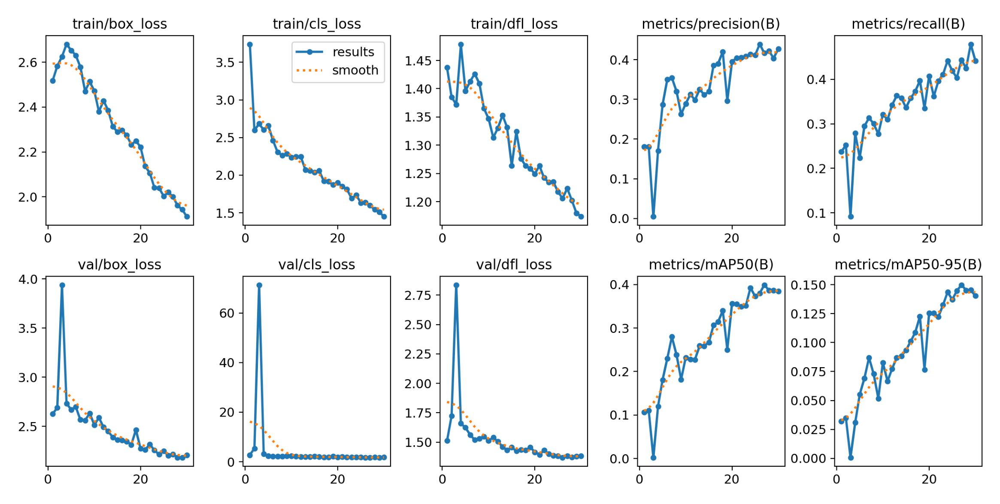

In [7]:
# Выведем графики обучения модели (укажем путь к картинке в которую сохраняется результат)
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('/content/drive/MyDrive/Colab Notebooks/ML_System_Design/results_yolo8/exp6_train/results.png'))

In [8]:
!yolo task=detect\
mode=val\
model='/content/drive/MyDrive/Colab Notebooks/ML_System_Design/results_yolo8/exp6_train/weights/best.pt'\
name='/content/drive/MyDrive/Colab Notebooks/ML_System_Design/results_yolo8/exp6_test'\
data='/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data.yaml'\
imgsz=640

Ultralytics YOLOv8.0.208 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_2_Caries_v0-v0/test/labels.cache... 31 images, 0 backgrounds, 0 corrupt: 100% 31/31 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 2/2 [00:06<00:00,  3.17s/it]
                   all         31        125      0.456      0.368      0.344      0.127
Speed: 5.2ms preprocess, 23.2ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to /content/drive/MyDrive/Colab Notebooks/ML_System_Design/results_yolo8/exp6_test
💡 Learn more at https://docs.ultralytics.com/modes/val


In [9]:
!yolo task=detect\
mode=predict\
model='/content/drive/MyDrive/Colab Notebooks/ML_System_Design/results_yolo8/exp6_train/weights/best.pt'\
source="/content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_2_Caries_v0-v0/test/images/"\
show=False\
imgsz=640\
name='/content/drive/MyDrive/Colab Notebooks/ML_System_Design/results_yolo8/exp6_predict'\
show_labels=True

Ultralytics YOLOv8.0.208 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs

image 1/31 /content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_2_Caries_v0-v0/test/images/010_00496_10_a091_jpg.rf.8bb02469cd2815d13f975e1d27d3c052.jpg: 640x640 2 cariess, 37.0ms
image 2/31 /content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_2_Caries_v0-v0/test/images/010_00496_12_a091_jpg.rf.da2fa93dda94d5b01ca63b092ba13902.jpg: 640x640 1 caries, 33.4ms
image 3/31 /content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_2_Caries_v0-v0/test/images/010_00506_06_a091_jpg.rf.cebb8bcd4c59507cf64be64ae5af0033.jpg: 640x640 3 cariess, 34.3ms
image 4/31 /content/drive/MyDrive/Colab Notebooks/ML_System_Design/data/dentasis_v30_2_Caries_v0-v0/test/images/010_00506_10_a091_jpg.rf.7b72f0724cd237249080646258903dce.jpg: 640x640 2 cariess, 33.4ms
image 5/31 /content/drive/M

In [10]:
# Путь до сохраненных результатов работы модели на теcтовом множестве.
path_to_output = "/content/drive/MyDrive/Colab Notebooks/ML_System_Design/results_yolo8/exp6_predict/"
output_list = os.listdir(path_to_output)

print(output_list)

['010_00496_10_a091_jpg.rf.8bb02469cd2815d13f975e1d27d3c052.jpg', '010_00496_12_a091_jpg.rf.da2fa93dda94d5b01ca63b092ba13902.jpg', '010_00506_06_a091_jpg.rf.cebb8bcd4c59507cf64be64ae5af0033.jpg', '010_00506_10_a091_jpg.rf.7b72f0724cd237249080646258903dce.jpg', '010_00508_06_a091_jpg.rf.0984518d7f351b59917e4bcd2bd3be74.jpg', '010_00527_11_a091_jpg.rf.e771eb7d81448f78eb4b3e6c7b2cb633.jpg', '010_00527_12_a091_jpg.rf.2723a9a408bbf534ca2441defc0c902c.jpg', '010_00548_10_a091_jpg.rf.bbe50d3d38fa1525a0a7ae0d31a5f104.jpg', '010_00550_11_a091_jpg.rf.8bf594069b356df23d288d922b5299fc.jpg', '010_00550_12_a091_jpg.rf.274834dedf9318022c146452b4b02e4a.jpg', '010_00551_12_a091_jpg.rf.f7f43c6dc5d0c5f58c6b09134185bff4.jpg', '011_00491_12_a091_jpg.rf.f28b0079d0706ea5e2a26de1b7e75968.jpg', '011_00493_11_a091_jpg.rf.d9cd01a4ad65aae4049a99e0eba6e507.jpg', '011_00501_07_a091_jpg.rf.3f51f3501d4d722129dd4ccb84200483.jpg', '011_00501_09_a091_jpg.rf.36e064b005850f6cadc4472902a1a02f.jpg', '011_00501_10_a091_jpg.r

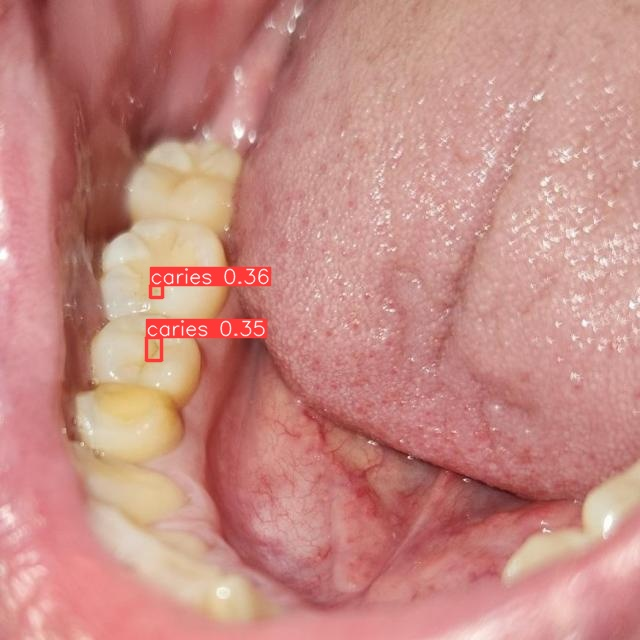

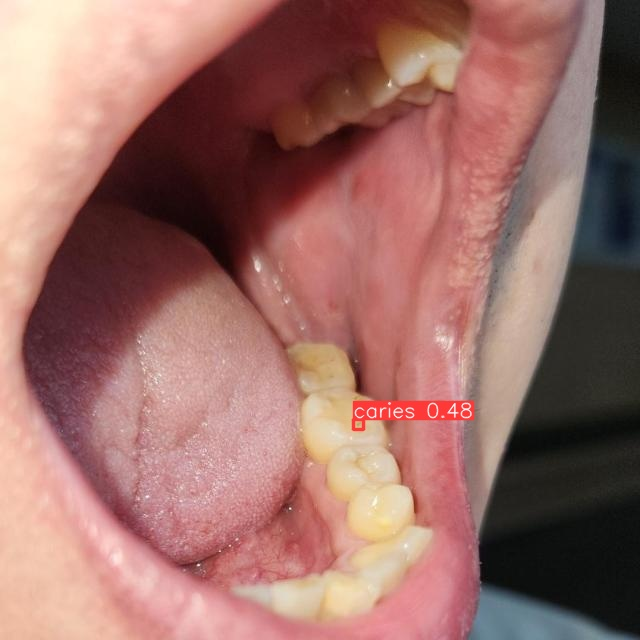

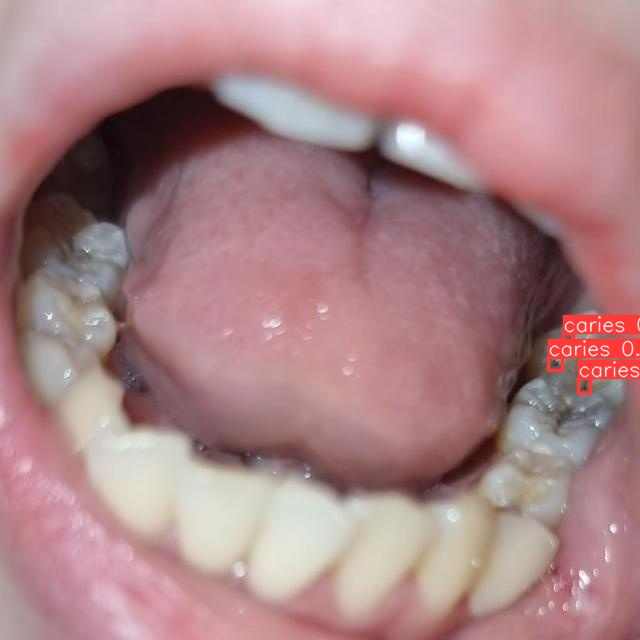

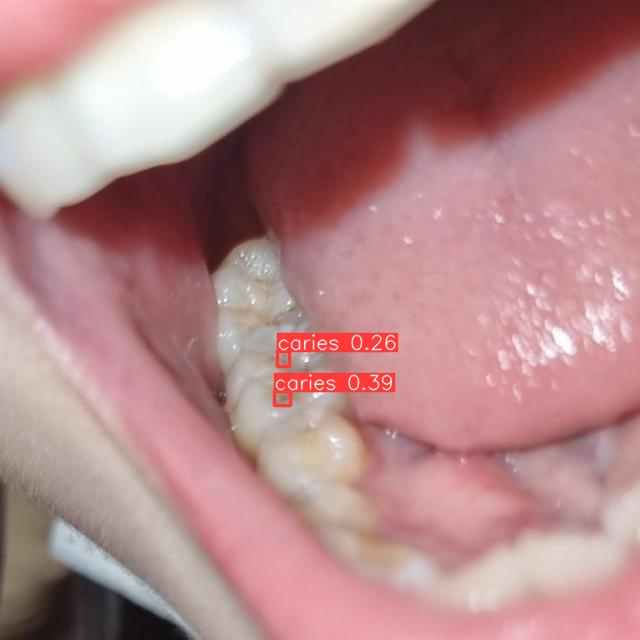

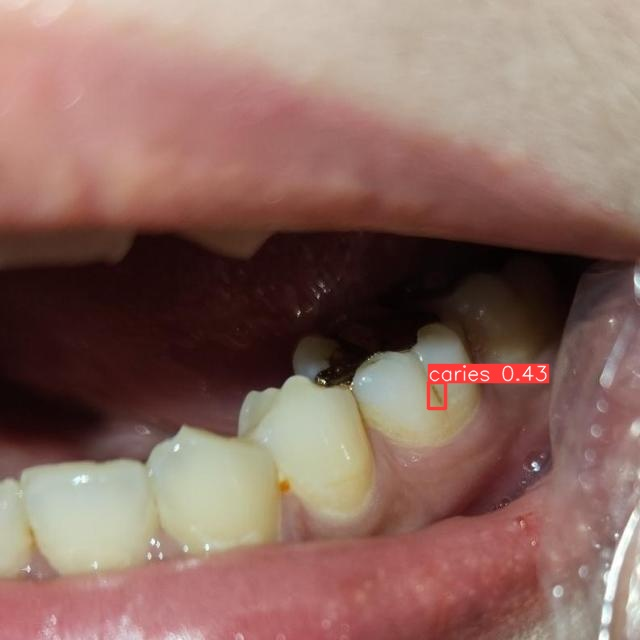

...

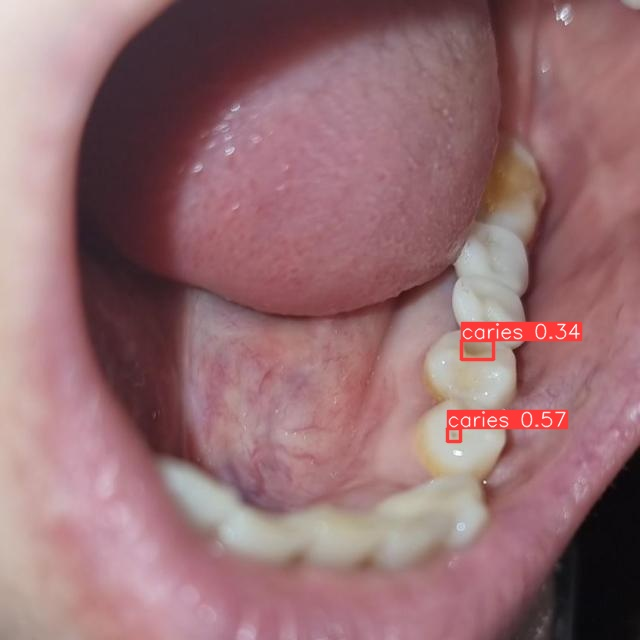

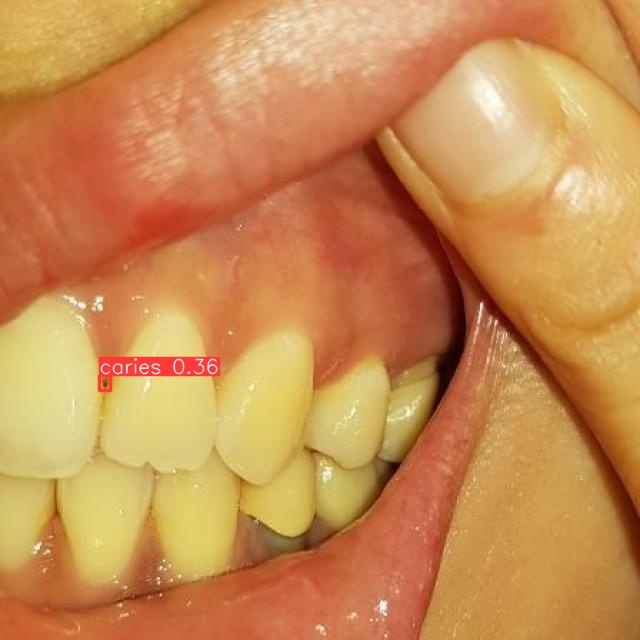

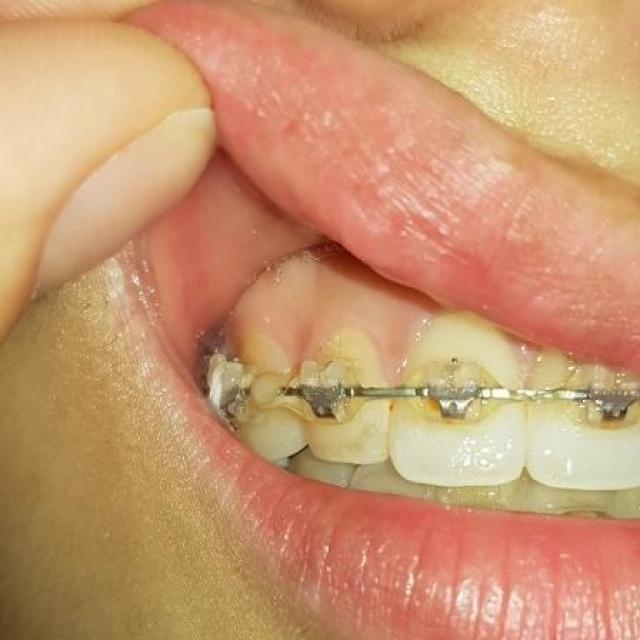

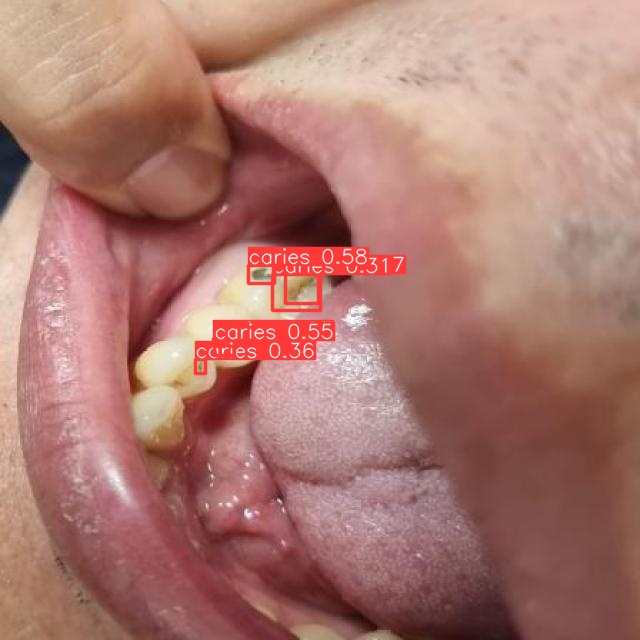

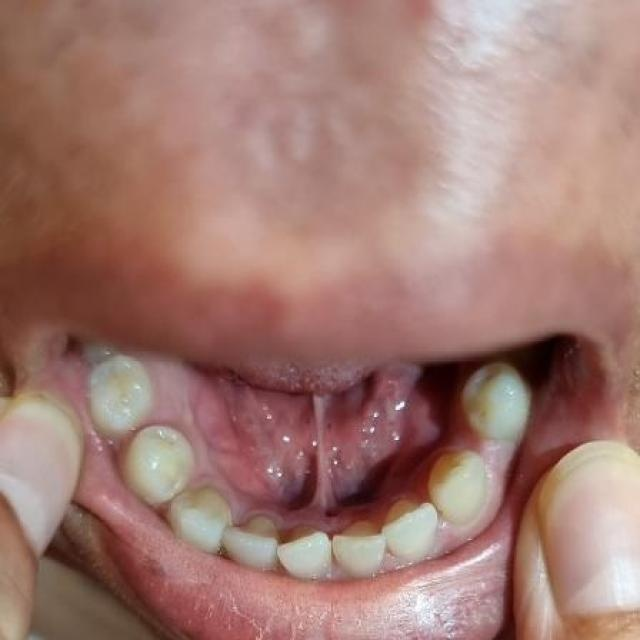

In [11]:
# Посмотрим на результат работы модели. Выведем изображения с боксами.
for out in output_list:
  image = Image.open(path_to_output + out)
  display(image)